!pip install numpy matplotlib torch scipy torchvision

In [1]:
import torch
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from collections import deque

from IPython.display import HTML
%matplotlib inline

# Intro to Neural Networks

In [2]:
# PyTorch

In [3]:
y = torch.tensor([1.]) # actual output
x = torch.tensor([0.8]) # input
x

tensor([0.8000])

## Model (One node neural network)

In [4]:
model = torch.nn.Sequential(
    torch.nn.Linear(in_features=1, out_features=1, bias=True)
)

In [5]:
# You can access the first layer of `model` like accessing the first item of a list
linear_layer = model[0]

# For linear layer, its parameters are stored as `weight` and `bias`.
print(linear_layer.bias.item())
print(linear_layer.weight.item())

print(x*linear_layer.weight.item() + linear_layer.bias.item()) # predicted output right now: y_0

0.9085903167724609
0.16615760326385498
tensor([1.0415])


In [6]:
# You can access the first layer of `model` like accessing the first item of a list
linear_layer = model[0]

# For linear layer, its parameters are stored as `weight` and `bias`.
print(linear_layer.bias.item())
print(linear_layer.weight.item())

print(x*linear_layer.weight.item() + linear_layer.bias.item()) # predicted output right now: y_0

0.9085903167724609
0.16615760326385498
tensor([1.0415])


In [7]:
y_pred = model(x)
y_pred

tensor([1.0415], grad_fn=<ViewBackward0>)

## Mean square error loss

In [8]:
loss_fn_mse = torch.nn.MSELoss(reduction='mean')

In [9]:
loss = loss_fn_mse(y_pred, y)
loss

tensor(0.0017, grad_fn=<MseLossBackward0>)

In [10]:
((y_pred-y)**2)

tensor([0.0017], grad_fn=<PowBackward0>)

## L1 error

In [11]:
loss_fn_L1 = torch.nn.L1Loss()

In [12]:
loss = loss_fn_L1(y_pred, y)
loss

tensor(0.0415, grad_fn=<MeanBackward0>)

In [13]:
abs((y_pred-y))

tensor([0.0415], grad_fn=<AbsBackward0>)

## Compute Loss

In [14]:
model.zero_grad()
loss.backward()

In [15]:
for param in model.parameters():
   print(f'Gradient: {param.grad[0]}')

Gradient: tensor([0.8000])
Gradient: 1.0


## Simulating a neural network

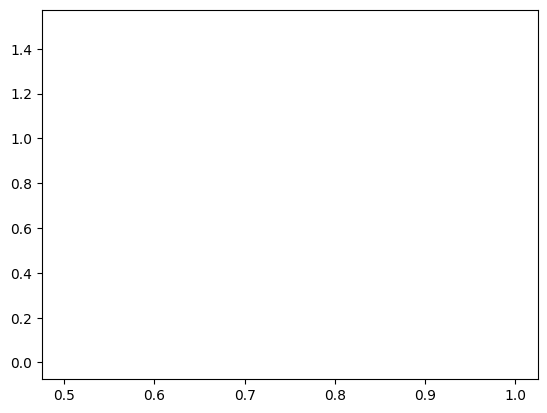

In [16]:
model = torch.nn.Sequential(
    torch.nn.Linear(in_features=1, out_features=1, bias=True)
)
y_pred = model(x)
criterion = torch.nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.1)

# Set up animation figure
fig, ax = plt.subplots()
line, = ax.plot([0.5, 1], [0, 1.5], lw=2)

# Initialize empty lists to store points for animation
x_points = deque([x.numpy()]*2)
y_points = deque([y_pred.detach().numpy()]*2)

# Define the update function for the animation
def update(frame):
    optimizer.zero_grad()
    output = model(x)
    loss = criterion(output, y)
    loss.backward()
    optimizer.step()
    
    x_points.append(x.numpy())
    y_points.append(output.detach().numpy())

    x_points.popleft()
    y_points.popleft()
    
    line.set_data(x_points, y_points)
    return line,

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=20, blit=True)
HTML(ani.to_jshtml())

## Picking up the complexity: Model to estimate sine function

In [17]:
# Create Tensors to hold input and outputs.
x = torch.linspace(-math.pi, math.pi, 2000)
y = torch.sin(x)

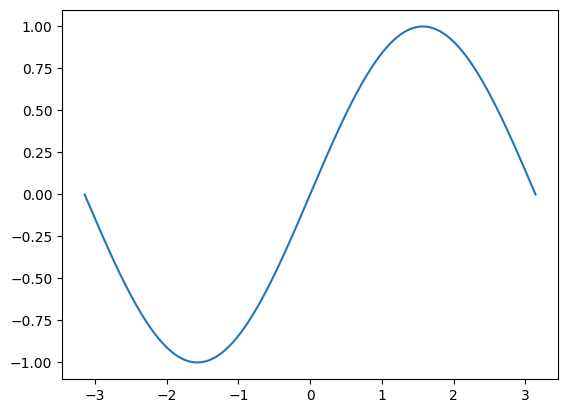

In [18]:
plt.plot(x,y);

In [19]:
p = torch.tensor([1, 2, 3])
xx = x.unsqueeze(-1).pow(p)
xx.size()

torch.Size([2000, 3])

In [20]:
xx[0]

tensor([ -3.1416,   9.8696, -31.0063])

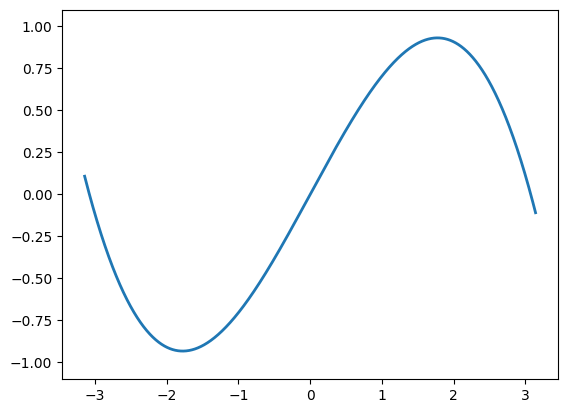

In [21]:
# Create a neural network with 1 hidden layer with 3 nodes
model = torch.nn.Sequential(
    torch.nn.Linear(3, 1),
    torch.nn.Flatten(0, 1)
)
criterion = torch.nn.MSELoss()
learning_rate = 5e-3
optimizer = torch.optim.RMSprop(model.parameters(), lr=learning_rate)

# Set up animation figure
fig, ax = plt.subplots()
line, = ax.plot([-math.pi, math.pi], [-1, 1], lw=2)

# Initialize empty lists to store points for animation
x_train = xx
y_train = y

# Define the update function for the animation
def update(frame):
    optimizer.zero_grad()
    output = model(x_train)
    loss = criterion(output, y_train)
    loss.backward()
    optimizer.step()
    
    x_points = x.numpy()
    y_points = output.detach().numpy()
    
    line.set_data(x_points, y_points)
    return line,

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=300, blit=True)
HTML(ani.to_jshtml())

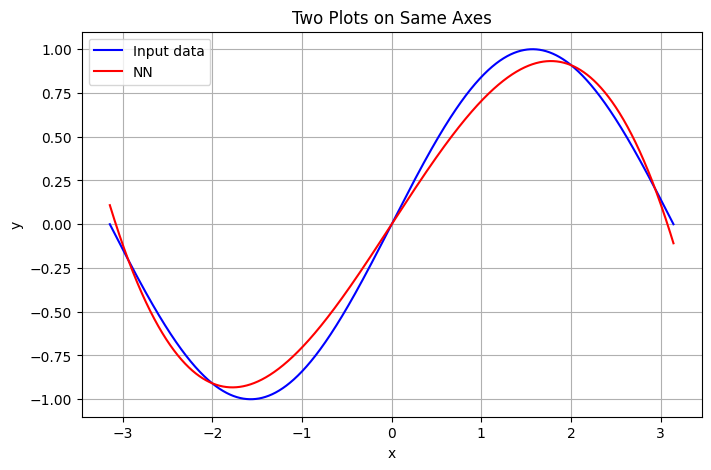

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# Generate some sample data
y_nn = model(x_train)

# Create a single set of axes
plt.figure(figsize=(8, 5))

# Plot the first function
plt.plot(x, y, color='blue', label='Input data')

# Plot the second function on the same axes
plt.plot(x, y_nn.detach().numpy(), color='red', label='NN')

# Add labels, title, and legend
plt.xlabel('x')
plt.ylabel('y')
plt.title('Two Plots on Same Axes')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()
